In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from PIL import Image
import scipy.spatial
from itertools import product
import sys

In [3]:
images = {} #this will store images of each person
#loading all images into the "images" dictionary
size = 100
num_faces = 0

for image_str in os.listdir('raj_faces'):
    if(len(image_str) == 8):
        num_faces+=1
        if images.get('raj',0) == 0:
            images['raj'] = []
        img = Image.open('raj_faces/'+image_str)
        new_img = img.resize((size,size))    #resize all pics to same size
        images['raj'].append(new_img.convert('L'))

for image_str in os.listdir('alex'):
    
    if(len(image_str) == 10):
        num_faces+=1
        if images.get('alex',0) == 0:
            images['alex'] = []
        img = Image.open('alex/'+image_str)
        new_img = img.resize((size,size))    #resize all pics to same size
        images['alex'].append(new_img.convert('L'))


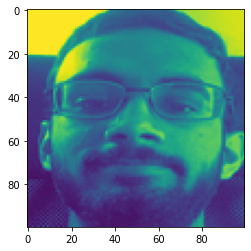

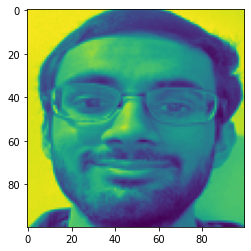

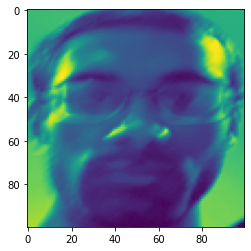

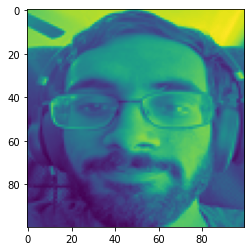

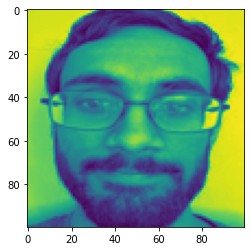

...

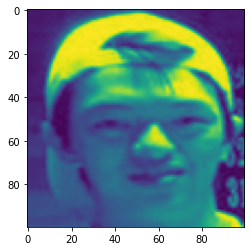

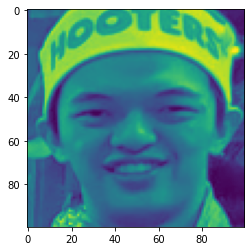

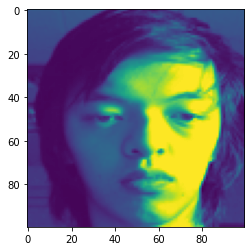

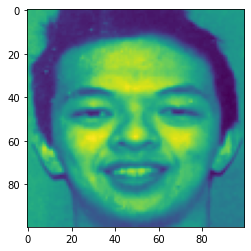

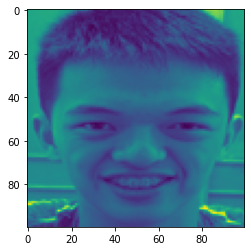

In [5]:
for key in images.keys():
    for i in range(len(images[key])):
        plt.imshow(images[key][i].convert('L'))
        plt.show()

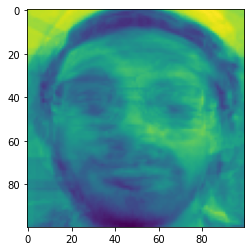

(100, 100)

In [6]:
avg_face = np.zeros((size,size))


for key in images.keys():
    for i in range(len(images[key])):
        avg_face += np.array(images[key][i].convert('L'))

        
avg_face /= num_faces
plt.imshow(avg_face)
plt.show()
avg_face.shape

In [7]:
A = np.empty((num_faces,size*size))

face_idx = 0
for key in images.keys():
    for i in range(len(images[key])):
        orig_face = images[key][i].convert('L')
        A[face_idx] = (np.array(orig_face)-avg_face).flatten()
        face_idx+=1

In [8]:
A = A.T


In [9]:
L = np.matmul(A.T,A)
L /= num_faces


In [10]:
A.shape

(10000, 15)

In [11]:
L.shape

(15, 15)

In [12]:
evals, evects = np.linalg.eig(L)

sort_indices = evals.argsort()[::-1]                             
evals = evals[sort_indices]                               
evects = evects[:,sort_indices]

M_prime = (num_faces//2)
evals = evals[:M_prime]
evects = evects[:,:M_prime]

In [13]:
sort_indices

array([ 0,  1,  2,  3, 14, 13, 12, 11, 10,  7,  9,  8,  6,  5,  4],
      dtype=int64)

In [14]:
np.diff(evals)

array([-4852257.94663192,  -801029.83321927, -1014638.25423941,
       -2021090.60161538,   -46485.41622534,   -51761.73468918])

In [15]:
evects = np.dot(A,evects)

In [16]:
for i in range(M_prime):
    
    evects[:,i] = evects[:,i]/np.linalg.norm(evects[:,i])

In [17]:
np.set_printoptions(threshold=sys.maxsize)
print(evects[:,1])
np.set_printoptions(threshold=1000)

[ 4.97865945e-03  4.04350891e-03  3.46942398e-03  3.30846737e-03
  3.03581100e-03  3.18682118e-03  3.20260221e-03  2.70643355e-03
  3.19730380e-03  3.53323411e-03  3.15384321e-03  2.87562536e-03
  2.31169295e-03  1.73478132e-03  1.59682493e-03  1.63535596e-03
  1.30483734e-03  9.49921880e-04 -1.43066504e-03 -3.51773833e-03
 -5.27216640e-03 -6.08236537e-03 -6.65102807e-03 -7.54851271e-03
 -6.88616861e-03 -6.92457378e-03 -6.91239210e-03 -7.00714823e-03
 -8.22179617e-03 -8.98795246e-03 -9.65106599e-03 -9.86875380e-03
 -1.03482200e-02 -1.03833115e-02 -1.03489407e-02 -1.06252157e-02
 -9.98721672e-03 -8.07324348e-03 -6.09247726e-03 -6.63289872e-03
 -7.08283994e-03 -6.91239825e-03 -8.57944141e-03 -1.11474528e-02
 -1.35827811e-02 -1.49342921e-02 -1.57981623e-02 -1.50280042e-02
 -1.33300535e-02 -1.32806852e-02 -1.35124553e-02 -1.39592588e-02
 -1.37304659e-02 -1.42119097e-02 -1.39248360e-02 -1.35053612e-02
 -1.28401883e-02 -1.24249503e-02 -1.22797329e-02 -1.37629856e-02
 -1.29902145e-02 -9.64362

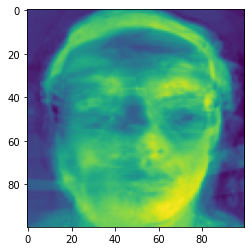

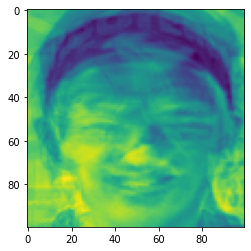

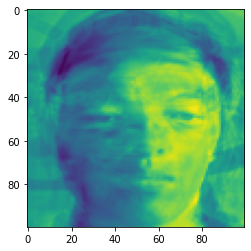

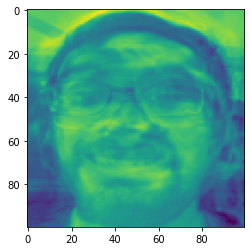

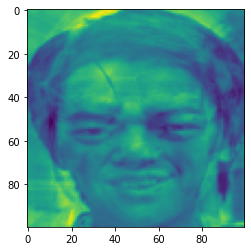

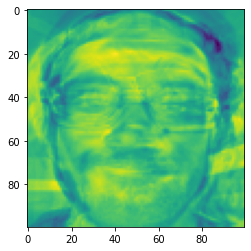

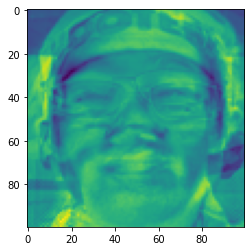

In [18]:
for i in range(M_prime):
    temp = evects[:,i].reshape(100,100)
    plt.imshow(temp)
    plt.show()

In [19]:
W_k = np.dot(evects.T,A)

In [20]:
#now onto testing:

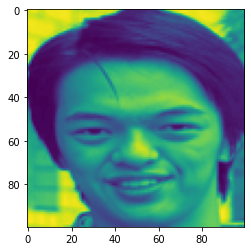

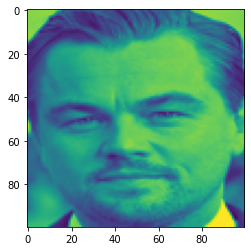

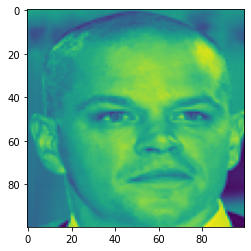

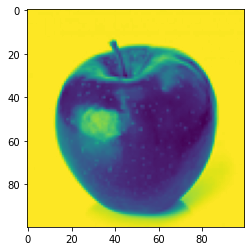

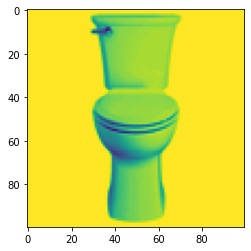

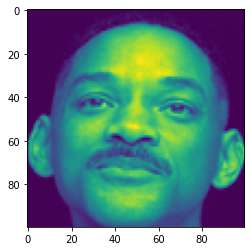

In [21]:
new_faces = {}
for image_str in os.listdir('test'):
    name_arr = image_str.split('-')
    name = name_arr[0] +' ' + name_arr[1]
    img = Image.open('test/'+image_str)
    img = img.resize((size,size)).convert('L')
    new_faces[name] = img.convert('L')
    
    plt.imshow(img)
    plt.show()

In [31]:
def solve(image):
    img = (image - avg_face).reshape(size*size,1)

    W = np.dot(evects.T,img)
    norms = np.linalg.norm(W-W_k, axis = 0)

#     avg_norms = np.zeros(int(num_faces/4))
#     for i in range(len(avg_norms)):
#         for j in range(4):
#             avg_norms[i] += norms[i*4+j]
#     avg_norms/=4
# #     print(avg_norms) #check for recognition
    phi_hat = np.zeros(size*size)
    phi = img.reshape(size*size)
    for i in range(M_prime):
#         print(evects.shape)
#         print(evects.T[i].shape)
#         print(phi.shape)
#         print(evects[i].shape)
#         print(np.dot(evects.T[i],phi))
        phi_hat += evects.T[i]@phi* evects.T[i]
    plt.imshow(phi_hat.reshape((100,100)))
    plt.show()
    norms_phi = np.linalg.norm(phi-phi_hat.reshape(size*size), axis = 0)

    norms_phi #check for detection

#     idx = np.argmin(avg_norms)
    detection_threshold = 3000
#     recognition_threshold = 7000
    if norms_phi <detection_threshold:
        print("We classify this as a face")
        print(norms_phi)
#         plt.imshow(img.reshape((size,size)))
#         plt.show()
        return True
    else:
        print("We classify this as not a face")
        print(norms_phi)
        return False
    



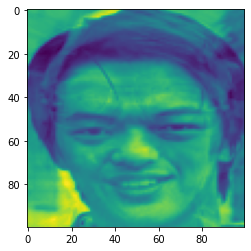

We classify this as a face
927.1365404201608


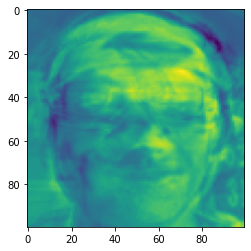

We classify this as a face
5122.850560452822


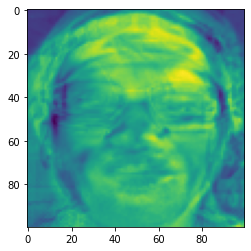

We classify this as a face
5336.146587516822


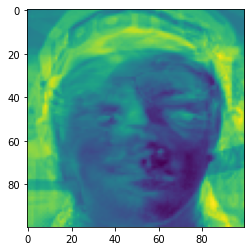

We classify this as not a face
8304.828488652798


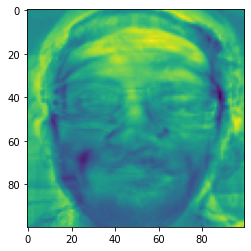

We classify this as not a face
11909.324551446758


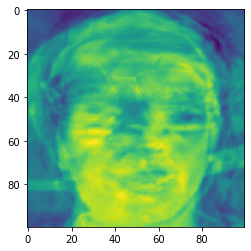

We classify this as a face
5065.030020961734


In [23]:
for key in new_faces.keys():
    img = new_faces[key]
    solve(img)



In [24]:
print(images.keys())

dict_keys(['raj', 'alex'])


raj


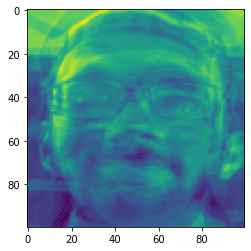

We classify this as a face
2414.873993715226


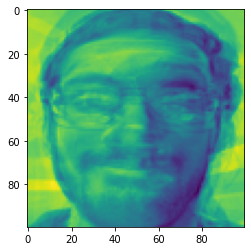

We classify this as a face
2354.9184082725365


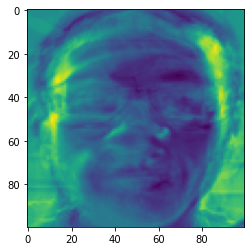

We classify this as a face
1815.5351077722848


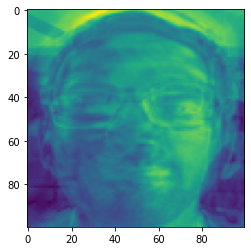

We classify this as a face
2766.5950747557004


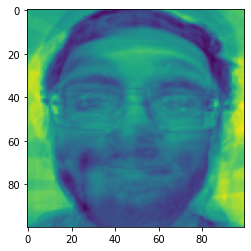

We classify this as a face
2482.732048590692


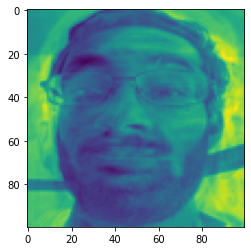

We classify this as a face
1862.6683355834068


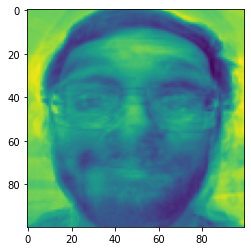

We classify this as a face
2866.9587912664315


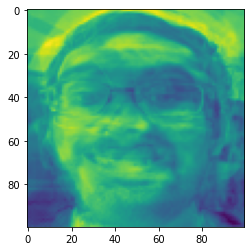

We classify this as a face
2910.3086925359457
alex


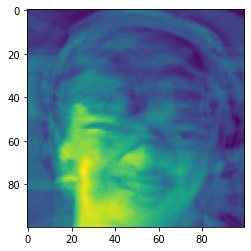

We classify this as a face
1873.303591559707


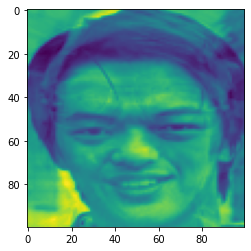

We classify this as a face
927.1365404201608


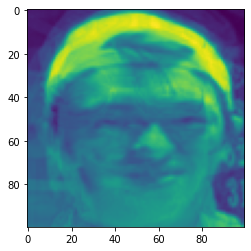

We classify this as a face
1640.5251784875652


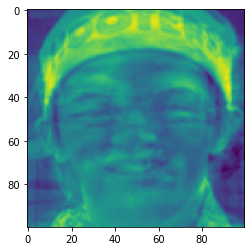

We classify this as a face
2319.0317768044506


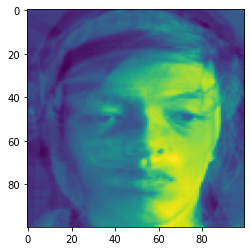

We classify this as a face
1507.5617119125266


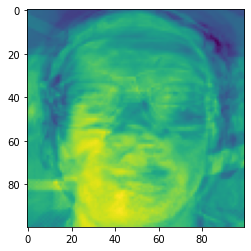

We classify this as a face
1914.8255768354195


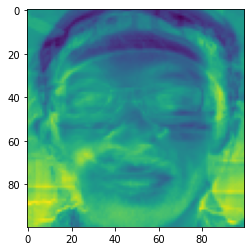

We classify this as a face
2366.129375196125


In [25]:
for key in images.keys():
    print(key)
    for j in range(len(images[key])):
        img = images[key][j]
        solve(img)

friends.jpg


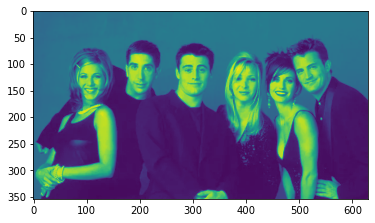

one_man.jpg


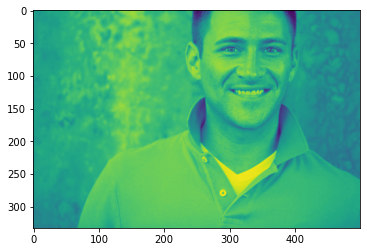

one_woman.jpg


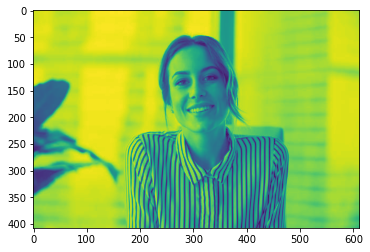

In [24]:
current_dir = 'full_images'
full_img = {}
for image_str in os.listdir(current_dir):
    name = image_str
    img = Image.open(current_dir+'/'+image_str)
#     img = img.resize((size,size)).convert('L')
    full_img[name] = img.convert('L')
    print(name)
    
    plt.imshow(full_img[name])
    plt.show()

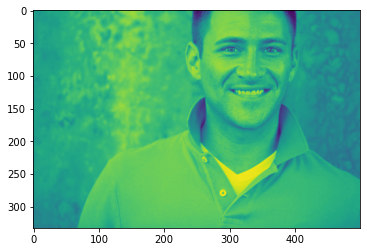

In [25]:
img = full_img['one_man.jpg']
plt.imshow(img)
plt.show()

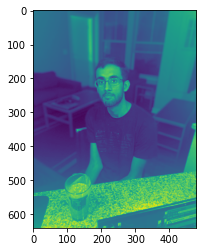

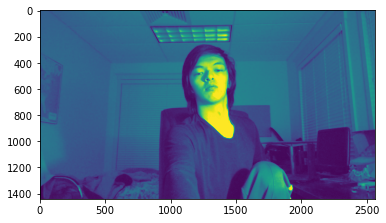

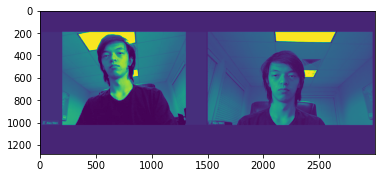

In [27]:
current_dir = 'full_images'
our_img = []

img = Image.open('raj_faces/full_1.jpg')
#     img = img.resize((size,size)).convert('L')
our_img.append(img.convert('L'))

plt.imshow(our_img[0])
plt.show()

img = Image.open('alex/img-1.jpg')
#     img = img.resize((size,size)).convert('L')
our_img.append(img.convert('L'))

plt.imshow(our_img[1])
plt.show()
img = Image.open('alex/img-2.jpg')
#     img = img.resize((size,size)).convert('L')
our_img.append(img.convert('L'))

plt.imshow(our_img[2])
plt.show()

In [32]:
img = our_img[0]

(0, 0, 150, 150)


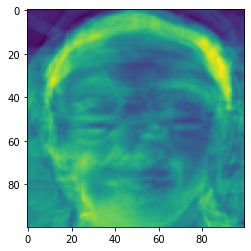

We classify this as a face
1534.913155053074
(0, 37, 150, 187)


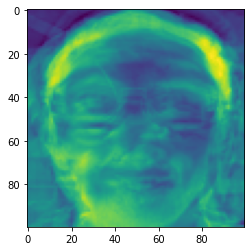

We classify this as a face
1475.3834629089956
(0, 74, 150, 224)


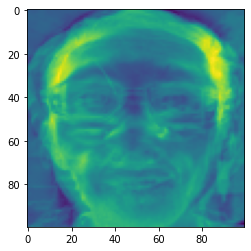

We classify this as a face
2534.07846163091
(0, 111, 150, 261)


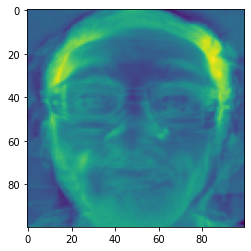

We classify this as not a face
3782.1913115784637
(0, 148, 150, 298)


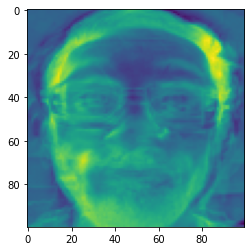

We classify this as not a face
4526.917308014554
(0, 185, 150, 335)


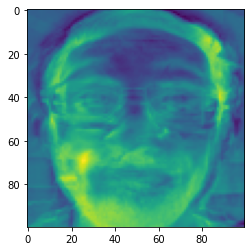

We classify this as not a face
4921.422889631213
(0, 222, 150, 372)


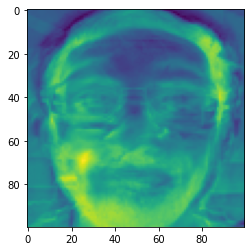

We classify this as not a face
5126.431442888979
(0, 259, 150, 409)


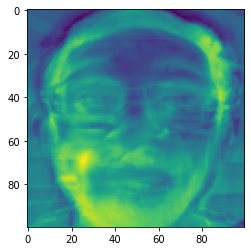

We classify this as not a face
5097.254488595014
(0, 296, 150, 446)


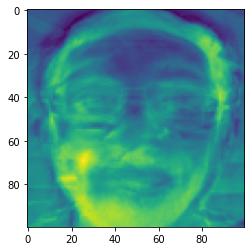

We classify this as not a face
4675.793901571509
(37, 0, 187, 150)


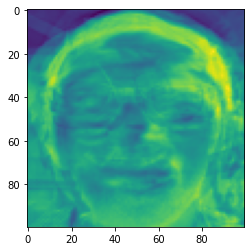

We classify this as a face
2070.6412829128044
(37, 37, 187, 187)


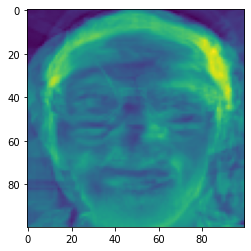

We classify this as a face
2010.881359527789
(37, 74, 187, 224)


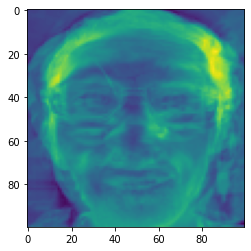

We classify this as a face
2277.462556212504
(37, 111, 187, 261)


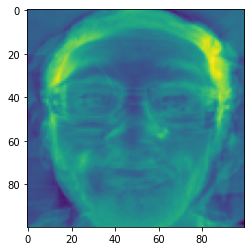

We classify this as not a face
3341.3744273322354
(37, 148, 187, 298)


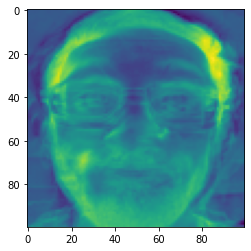

We classify this as not a face
4291.093595344931
(37, 185, 187, 335)


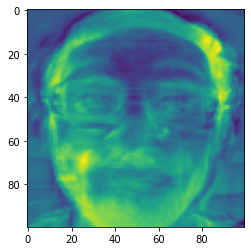

We classify this as not a face
4903.886711161202
(37, 222, 187, 372)


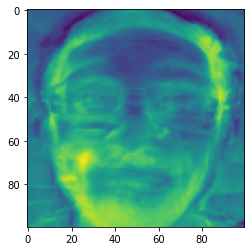

We classify this as not a face
5099.525478470564
(37, 259, 187, 409)


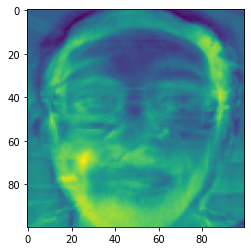

We classify this as not a face
5177.287075015454
(37, 296, 187, 446)


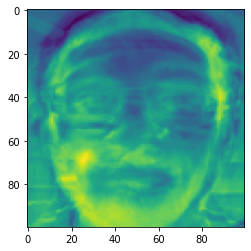

We classify this as not a face
4694.425861627321
(74, 0, 224, 150)


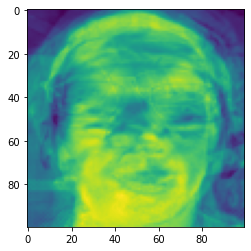

We classify this as a face
2260.8681144520324
(74, 37, 224, 187)


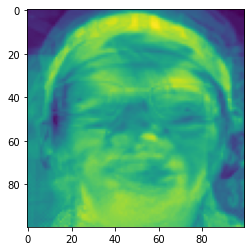

We classify this as a face
2660.105058399082
(74, 74, 224, 224)


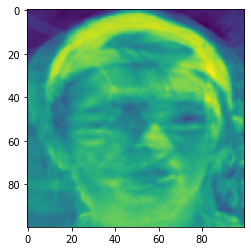

We classify this as not a face
3274.772730168666
(74, 111, 224, 261)


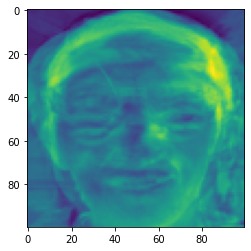

We classify this as not a face
3778.0385870154773
(74, 148, 224, 298)


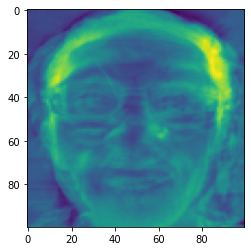

We classify this as not a face
4282.963206198329
(74, 185, 224, 335)


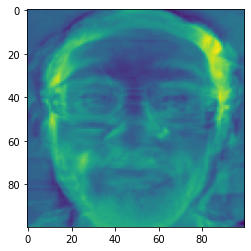

We classify this as not a face
4853.258963136265
(74, 222, 224, 372)


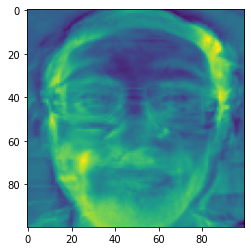

We classify this as not a face
4980.055129453194
(74, 259, 224, 409)


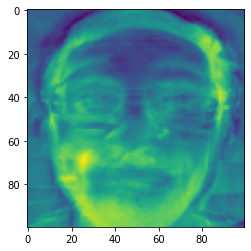

We classify this as not a face
4736.267983612831
(74, 296, 224, 446)


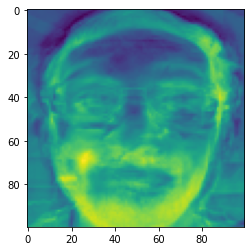

We classify this as not a face
4201.066650223388
(111, 0, 261, 150)


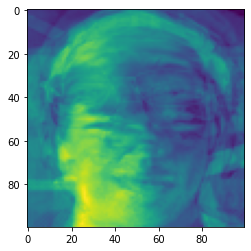

We classify this as a face
2516.257794364663
(111, 37, 261, 187)


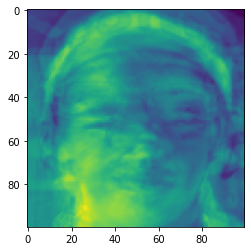

We classify this as not a face
3335.282318003809
(111, 74, 261, 224)


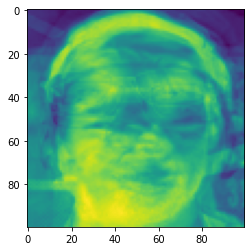

We classify this as not a face
3813.1170123539905
(111, 111, 261, 261)


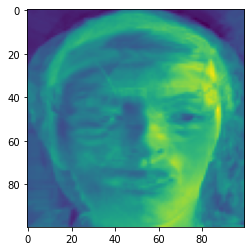

We classify this as not a face
3867.92817434762
(111, 148, 261, 298)


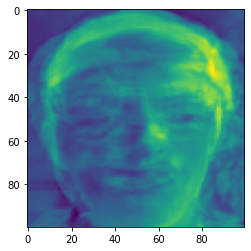

We classify this as not a face
3466.408157494952
(111, 185, 261, 335)


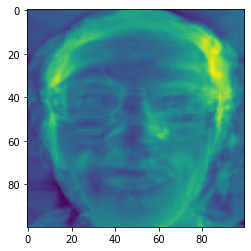

We classify this as not a face
4521.718777683298
(111, 222, 261, 372)


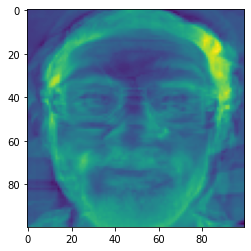

We classify this as not a face
5021.857976069151
(111, 259, 261, 409)


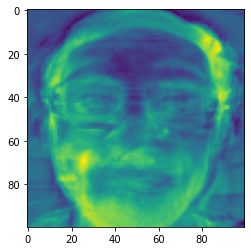

We classify this as not a face
4606.013098663608
(111, 296, 261, 446)


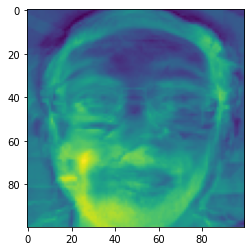

We classify this as not a face
4289.4584324654825
(148, 0, 298, 150)


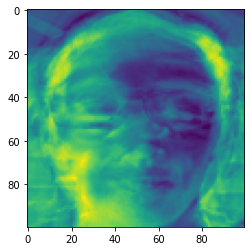

We classify this as a face
2401.4200689673453
(148, 37, 298, 187)


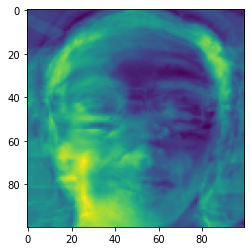

We classify this as not a face
3458.78882619237
(148, 74, 298, 224)


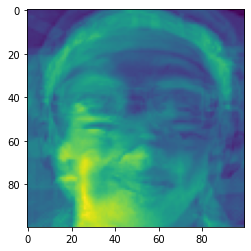

We classify this as not a face
3835.101991500332
(148, 111, 298, 261)


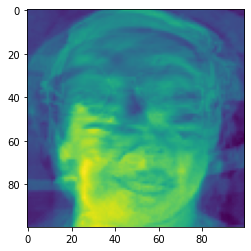

We classify this as not a face
4066.4318426849595
(148, 148, 298, 298)


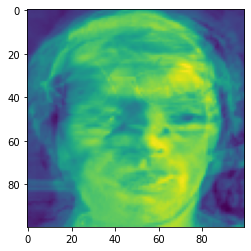

We classify this as not a face
3906.435930643404
(148, 185, 298, 335)


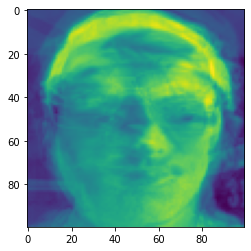

We classify this as not a face
4214.628312815376
(148, 222, 298, 372)


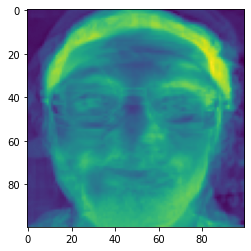

We classify this as not a face
4907.6663559450535
(148, 259, 298, 409)


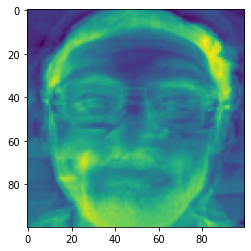

We classify this as not a face
4757.356600482527
(148, 296, 298, 446)


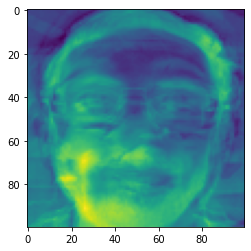

We classify this as not a face
4051.5315994281364
(185, 0, 335, 150)


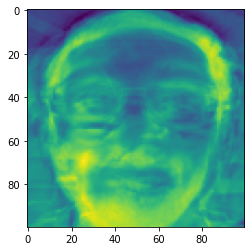

We classify this as a face
2489.534065484225
(185, 37, 335, 187)


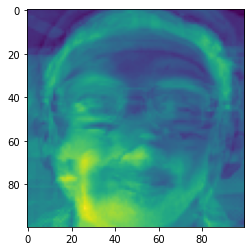

We classify this as not a face
3385.547224254333
(185, 74, 335, 224)


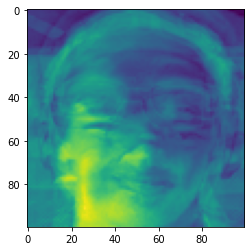

We classify this as not a face
3374.774480695028
(185, 111, 335, 261)


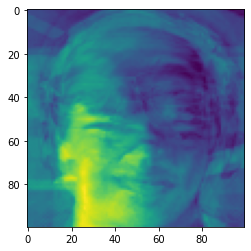

We classify this as not a face
3759.0325348651695
(185, 148, 335, 298)


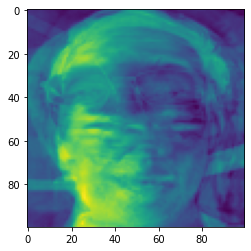

We classify this as not a face
4085.588257470703
(185, 185, 335, 335)


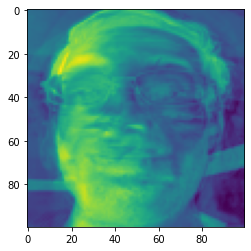

We classify this as not a face
4494.032878114349
(185, 222, 335, 372)


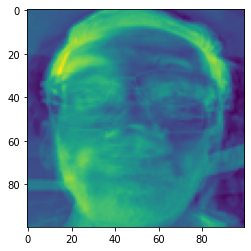

We classify this as not a face
4726.362902572109
(185, 259, 335, 409)


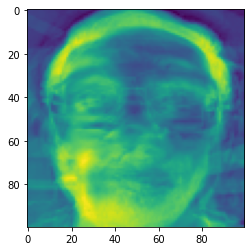

We classify this as not a face
4867.1002872221725
(185, 296, 335, 446)


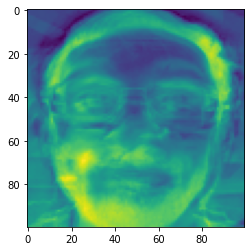

We classify this as not a face
4242.438603546452
(222, 0, 372, 150)


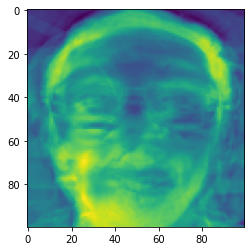

We classify this as a face
2470.5546849938014
(222, 37, 372, 187)


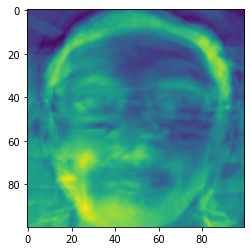

We classify this as not a face
3387.3743972963575
(222, 74, 372, 224)


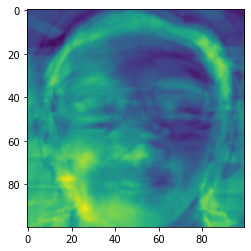

We classify this as not a face
3440.6231807963513
(222, 111, 372, 261)


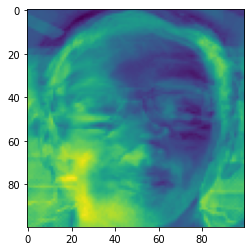

We classify this as not a face
3845.010051032358
(222, 148, 372, 298)


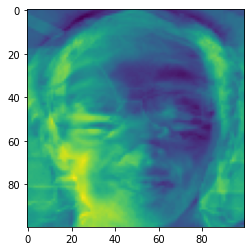

We classify this as not a face
3919.4850472636103
(222, 185, 372, 335)


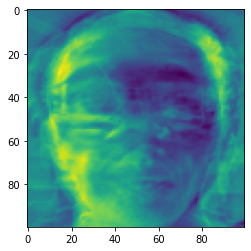

We classify this as not a face
3805.341632078189
(222, 222, 372, 372)


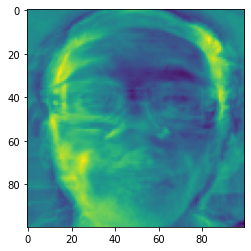

We classify this as not a face
4197.594392106697
(222, 259, 372, 409)


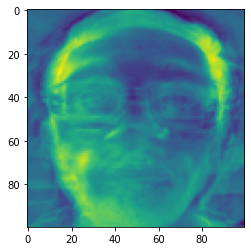

We classify this as not a face
3971.7045132692638
(222, 296, 372, 446)


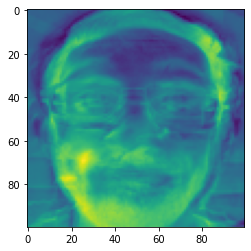

We classify this as not a face
3969.5056809700773
(259, 0, 409, 150)


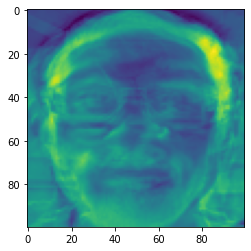

We classify this as a face
2240.7333269395044
(259, 37, 409, 187)


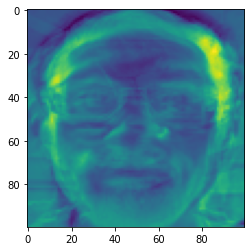

We classify this as a face
2460.2273686883195
(259, 74, 409, 224)


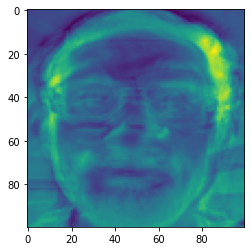

We classify this as a face
2843.3606030795104
(259, 111, 409, 261)


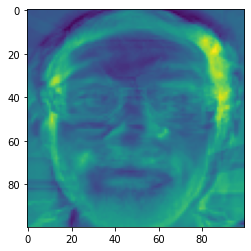

We classify this as a face
2991.8264708346433
(259, 148, 409, 298)


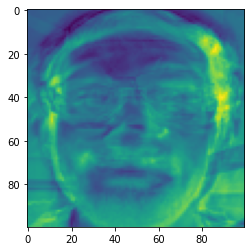

We classify this as not a face
3258.651048820248
(259, 185, 409, 335)


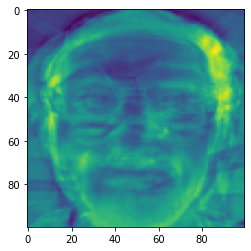

We classify this as not a face
3818.9537923527896
(259, 222, 409, 372)


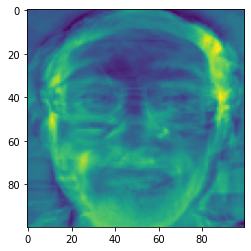

We classify this as not a face
4012.2695465985717
(259, 259, 409, 409)


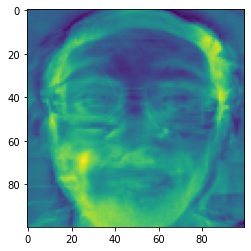

We classify this as not a face
4175.249456843035
(259, 296, 409, 446)


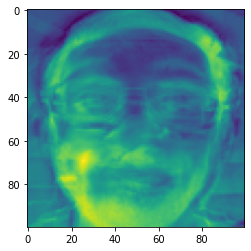

We classify this as not a face
3784.758280836012
(296, 0, 446, 150)


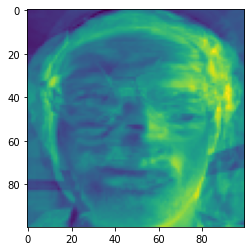

We classify this as a face
2415.0553830421113
(296, 37, 446, 187)


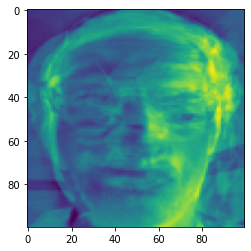

We classify this as a face
2480.7137550092375
(296, 74, 446, 224)


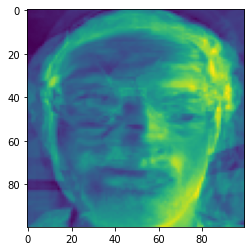

We classify this as a face
2826.6382966790743
(296, 111, 446, 261)


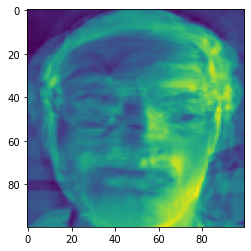

We classify this as a face
2895.8844591215466
(296, 148, 446, 298)


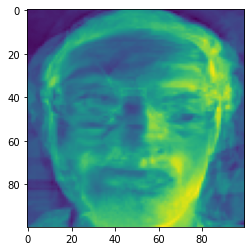

We classify this as not a face
3292.16401847461
(296, 185, 446, 335)


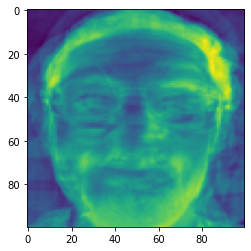

We classify this as not a face
3423.643884150067
(296, 222, 446, 372)


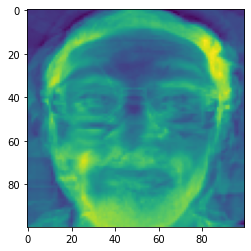

We classify this as not a face
3851.057245027946
(296, 259, 446, 409)


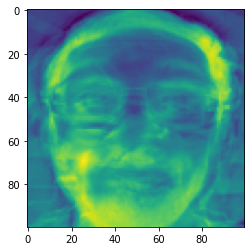

We classify this as not a face
3994.6830800775333
(296, 296, 446, 446)


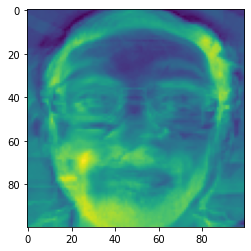

We classify this as not a face
3707.490801207349


In [33]:
width = 150
height = 150
boxes = []
for i in range(0,img.width,int(width)):
        for j in range(0,img.height//2,int(height)):
            right = min((i+width),img.width)
            upper = j
            left = i
            lower = min((j + height),img.height)
            if right - left < width or lower-upper < height:
                continue
            bbox = (left,upper,right,lower)
            crop = img.crop(bbox).resize((size,size)).convert('L')
            print(bbox)
    #         plt.imshow(crop)
    #         plt.show()
            if solve(crop):
                boxes.append([left,right,upper,lower])

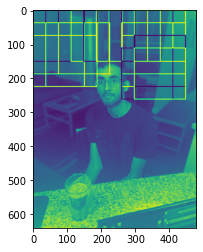

In [34]:
#top left
temp_img = img
for i in range(len(boxes)):
    if(boxes[i] == None):
        continue
    start_point = (boxes[i][0], boxes[i][2]) 

    # represents the bottom right corner of rectangle 
    end_point = (boxes[i][1], boxes[i][3]) 

    # Blue color in BGR 
    color = (255*(i%3), 255*(i+1%3),255*(i+2%3)) 

    # Line thickness of 2 px 
    thickness = 2

    # Using cv2.rectangle() method 
    # Draw a rectangle with blue line borders of thickness of 2 px 
    np_img = np.asarray(temp_img)
    image = cv2.rectangle(np_img, start_point, end_point, color, thickness) 
    temp_img = Image.fromarray(image)
plt.imshow(image)
plt.show()

In [ ]:
boxes

In [ ]:
merge_box(boxes,300)

In [ ]:
#top left
temp_img = img

for i in range(len(boxes)):
    if(boxes[i] == None):
        continue
    start_point = (boxes[i][0], boxes[i][2]) 

    # represents the bottom right corner of rectangle 
    end_point = (boxes[i][1], boxes[i][3]) 


    # Blue color in BGR 
    color = (255*(i%3), 255*(i+1%3),255*(i+2%3)) 

    # Line thickness of 2 px 
    thickness = 2

    # Using cv2.rectangle() method 
    # Draw a rectangle with blue line borders of thickness of 2 px 
    np_img = np.asarray(temp_img)
    image = cv2.rectangle(np_img, start_point, end_point, color, thickness) 
    temp_img = Image.fromarray(image)
plt.imshow(image)
plt.show() 

In [ ]:
boxes

In [ ]:
def should_merge(box1, box2,close_dist):
    a = (box1[0], box1[2]), (box1[1], box1[3])
    b = (box2[0], box2[2]), (box2[1], box2[3])

    if any(abs(a_v - b_v) <= close_dist for i in range(2) for a_v, b_v in product(a[i], b[i])):
        return True, [min(*a[0], *b[0]), min(*a[1], *b[1]), max(*a[0], *b[0]), max(*a[1], *b[1])]

    return False, None

def merge_box(boxes, close_dist = 100):
    for i, box1 in enumerate(boxes):
        for j, box2 in enumerate(boxes[i + 1:]):
            is_merge, new_box = should_merge(box1, box2,close_dist)
            if is_merge:
                boxes[i] = None
                boxes[j] = new_box
                break